In [2]:
import IPython.display
import numpy as np
import torch
from librosa.effects import time_stretch, pitch_shift

In [3]:
from sound_util import load_wav, show_log_melsp, calc_log_melsp

## オリジナル音源　(きりたんデータセット08番)

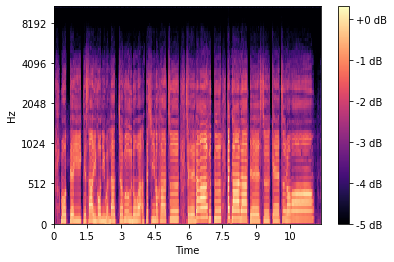

In [14]:
data, sr = load_wav('data/08_motteke.wav')

log_melsp_orig = calc_log_melsp(data)
show_log_melsp(log_melsp_orig, sr)

IPython.display.Audio(data, rate=sr)

## ホワイトノイズを付与(付与するかしないかの2択)

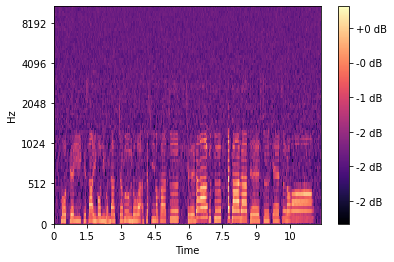

In [8]:
noise_rate = 0.02
w_noise = np.random.randn(len(data))
data_noised = data + noise_rate * w_noise

log_melsp_noised = calc_log_melsp(data_noised)
show_log_melsp(log_melsp_noised, sr)

IPython.display.Audio(data_noised, rate=sr)

## 時間軸方向にシフト;遅らせる(使わないかも)

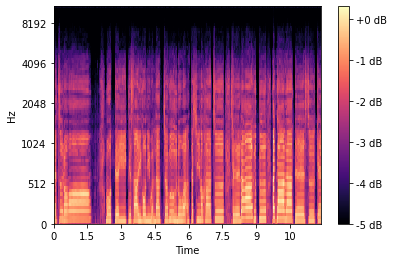

In [9]:
delay_shift_rate = 2
data_rolled = np.roll(data, delay_shift_rate * sr)

log_melsp_rolled = calc_log_melsp(data_rolled)
show_log_melsp(log_melsp_rolled, sr)

IPython.display.Audio(data_rolled, rate=sr)

## 時間軸方向に伸縮(速/遅とそのままの3択)

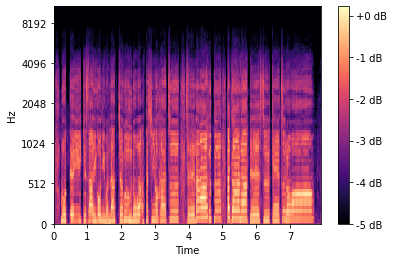

In [18]:
stretch_rate = 1.5  # positive, if >1 then speed up, if <1 then slow down
data_stretched = time_stretch(data, stretch_rate)

log_melsp_stretched = calc_log_melsp(data_stretched)
show_log_melsp(log_melsp_stretched, sr)

IPython.display.Audio(data_stretched, rate=sr)

## 基本周波数(f0, pitch)を上げ下げ(上げ下げとそのままの3択)

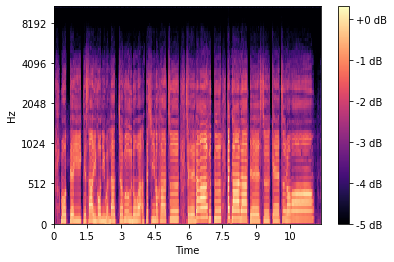

In [24]:
shift_steps = 0  # 何度上げ(+)下げ(-)するか
data_shifted = pitch_shift(data, sr, n_steps=shift_steps)

log_melsp_sifted = calc_log_melsp(data_shifted)
show_log_melsp(log_melsp_sifted, sr)

IPython.display.Audio(data_shifted, rate=sr)

### ノイズを加えて，時間方向に速く，基本周波数を下げる

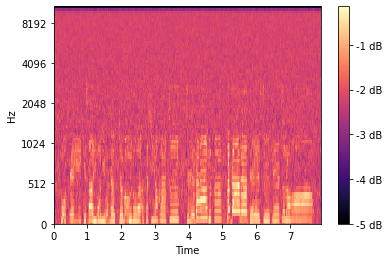

In [13]:
data_aug = data + noise_rate * w_noise
data_aug = time_stretch(data_aug, stretch_rate)
data_aug = pitch_shift(data_aug, sr, n_steps=shift_steps)

log_melsp_aug = calc_log_melsp(data_aug)
show_log_melsp(log_melsp_aug, sr)

IPython.display.Audio(data_aug, rate=sr)